# EMLDDMM Example: MRICloud atlas data



## Introdution
We run registration between a pair of T1 MRI images from mricloud.org.
Each includes a grayscale image and a set of labels.  We first run the
registration pipeline with a config file. We then run the transformation pipeline.


In [1]:
%matplotlib notebook
import numpy as np
import torch
import matplotlib.pyplot as plt

# append the parent directory to the path to load emlddmm
import sys
sys.path.append('..')
import emlddmm

import json
import nrrd
import os

import nibabel as nib
import glob

# for debugging only we will want to use imp
import imp
imp.reload(emlddmm)

<module 'emlddmm' from '../emlddmm.py'>

## Registration pipeline
Here we load the atlas and target images, and run multi scale registration.
Note the inputs

atlas_name,label_name,target_name: vtk filenames for images

config_file: json filename for options

output_dir: string containing a directory for outputs


In [2]:
# copied to local directory
atlas_name = '../example_images/mricloud/Adt27-55_02_Adt27-55_02_MNI.vtk'
label_name = '../example_images/mricloud/Adt27-55_02_Adt27-55_02_FullLabels.vtk'
target_name = '../example_images/mricloud/Adt27-55_03_Adt27-55_03_MNI.vtk'

config_file = 'config_mricloud.json'
output_dir = 'mricloud_test_outputs/'

In [3]:
with open(config_file) as f:
    config = json.load(f)
# I'm getting this for initial downsampling for preprocessing
downIs = config['downI']
downJs = config['downJ']

[1. 1. 1.]


<IPython.core.display.Javascript object>


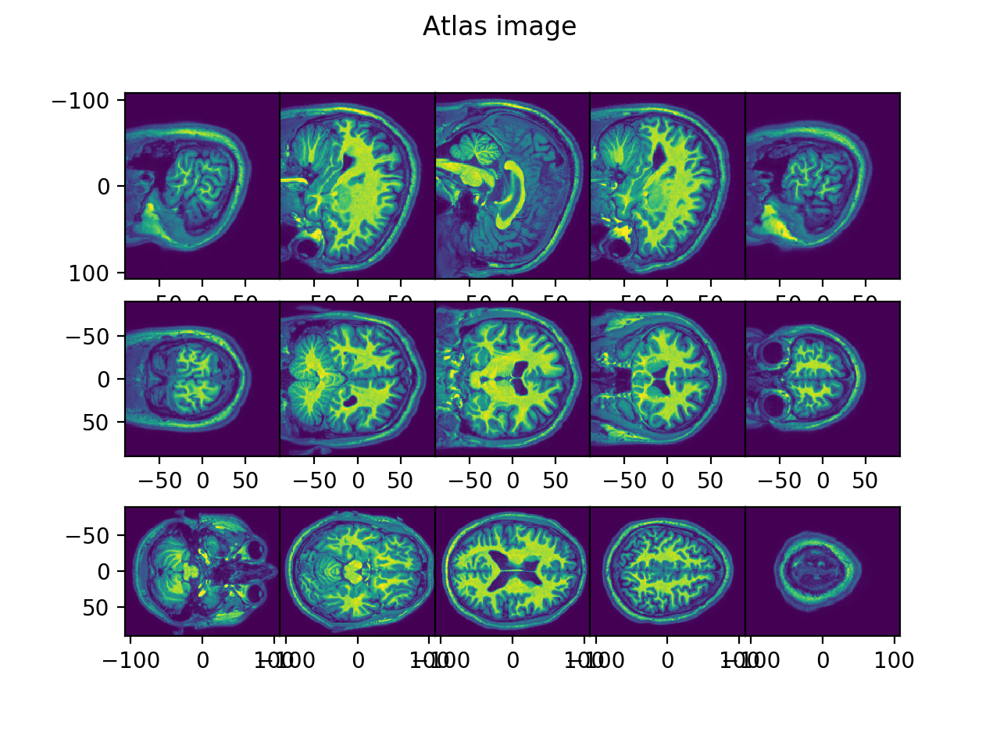

Text(0.5, 0.98, 'Atlas image')

In [4]:
# atlas
xI,I,title,names = emlddmm.read_data(atlas_name)
I = I.astype(float)
# normalize
I /= np.mean(np.abs(I))
dI = np.array([x[1]-x[0] for x in xI])
print(dI)
fig = emlddmm.draw(I,xI)
fig[0].suptitle('Atlas image')

In [5]:
# initial downsampling so there isn't so much on the gpu
mindownI = np.min(np.array(downIs),0)
xI,I = emlddmm.downsample_image_domain(xI,I,mindownI)
downIs = [ list((np.array(d)/mindownI).astype(int)) for d in downIs]
dI = [x[1]-x[0] for x in xI]
print(dI)
nI = np.array(I.shape,dtype=int)
# update our config variable
config['downI'] = downIs

[1.0, 1.0, 1.0]


[1. 1. 1.]


<IPython.core.display.Javascript object>


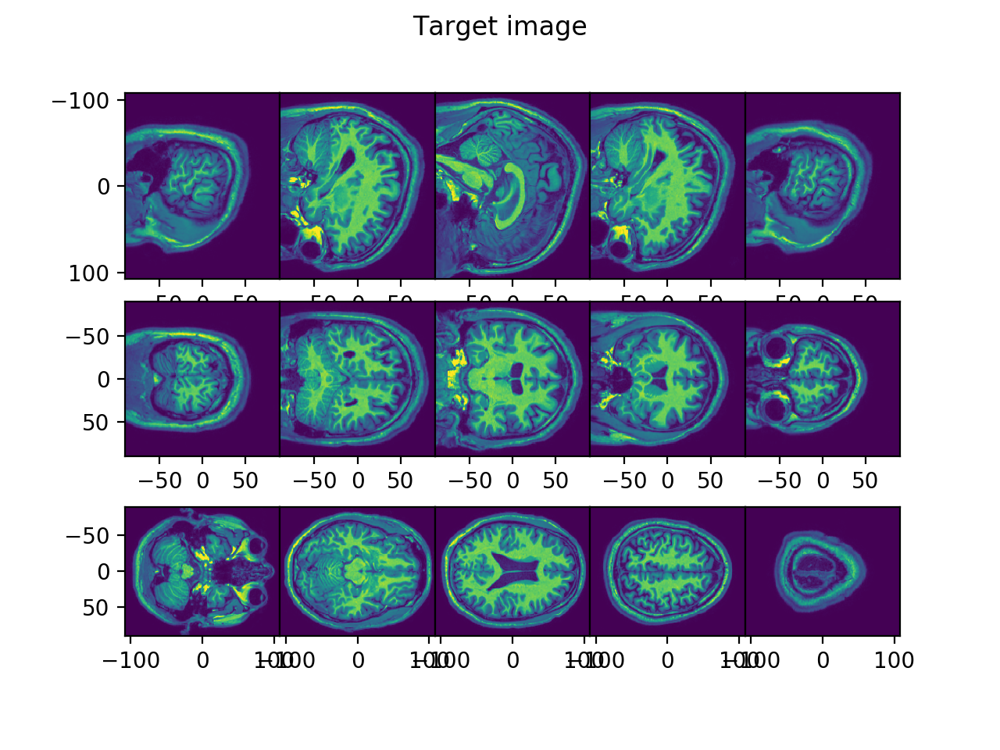

In [6]:
# target
imp.reload(emlddmm)
xJ,J,title,names = emlddmm.read_data(target_name)
J = J.astype(float)
J /= np.mean(np.abs(J))
dJ = np.array([x[1]-x[0] for x in xJ])
print(dJ)
J = J.astype(float)#**0.25
fig = emlddmm.draw(J,xJ)
fig[0].suptitle('Target image')
W0 = np.ones_like(J[0])

In [7]:
# initial downsampling so there isn't so much on the gpu
mindownJ = np.min(np.array(downJs),0)
xJ,J = emlddmm.downsample_image_domain(xJ,J,mindownJ)
W0 = emlddmm.downsample(W0,mindownJ)
downJs = [ list((np.array(d)/mindownJ).astype(int)) for d in downJs]
dJ = [x[1]-x[0] for x in xJ]
nJ = np.array(J.shape,dtype=int)
# update our config variable
config['downJ'] = downJs

<IPython.core.display.Javascript object>


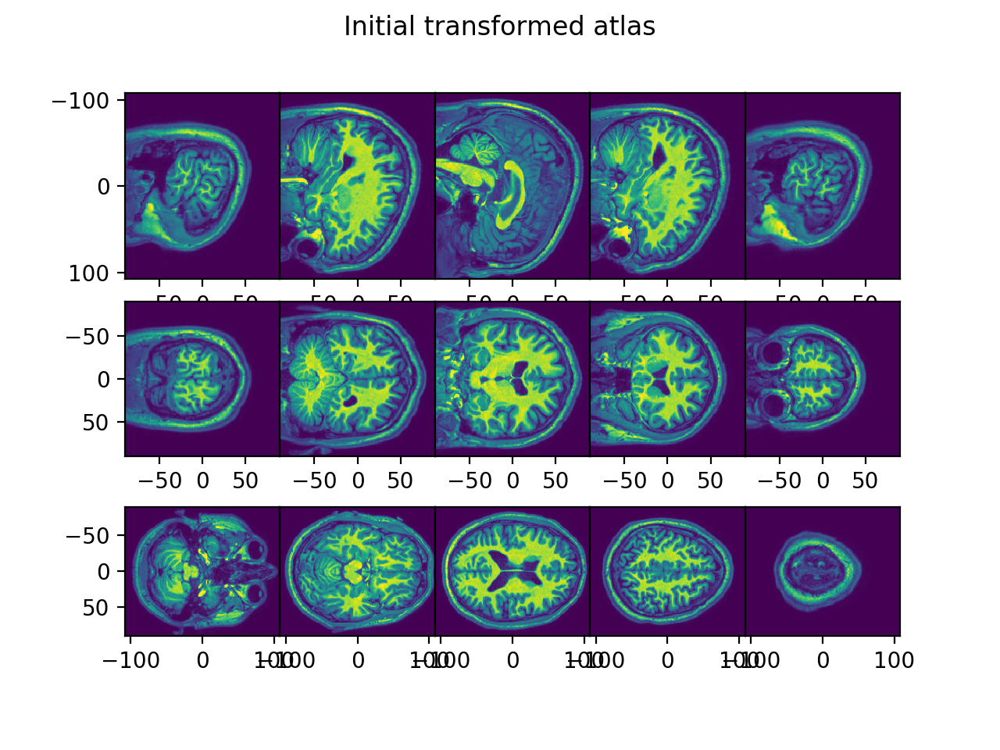

Text(0.5, 0.98, 'Initial transformed atlas')

In [8]:
imp.reload(emlddmm)
# visualize initial affine
if 'A' in config:
    A = np.array(config['A']).astype(float)
else:
    A = np.eye(4)
# this affine matrix should be 4x4, but it may be 1x4x4
if A.ndim > 2:
    A = A[0]
Ai = np.linalg.inv(A)
XJ = np.stack(np.meshgrid(*xJ,indexing='ij'),-1)
Xs = (Ai[:3,:3]@XJ[...,None])[...,0] + Ai[:3,-1]
out = emlddmm.interp(xI,I,Xs.transpose((3,0,1,2)))
fig = emlddmm.draw(out,xJ)
fig[0].suptitle('Initial transformed atlas')

In [9]:
config

{'n_iter': [500, 200, 100],
 'downI': [[4, 4, 4], [2, 2, 2], [1, 1, 1]],
 'downJ': [[4, 4, 4], [2, 2, 2], [1, 1, 1]],
 'a': [2.0],
 'sigmaR': [100.0],
 'sigmaM': [2.0],
 'sigmaB': [4.0],
 'sigmaA': [6.0],
 'ev': [0.1],
 'eA': [10.0],
 'priors': [[0.9, 0.05, 0.05]],
 'update_muA': [0],
 'update_muB': [0],
 'muB': [0.0],
 'update_sigmaM': [0],
 'update_sigmaA': [0],
 'update_sigmaB': [0],
 'order': [3],
 'n_draw': [50],
 'n_e_step': [3],
 'v_start': [500, 0, 0]}

Found 3 scales


/home/dtward/.local/intelpython3/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<IPython.core.display.Javascript object>


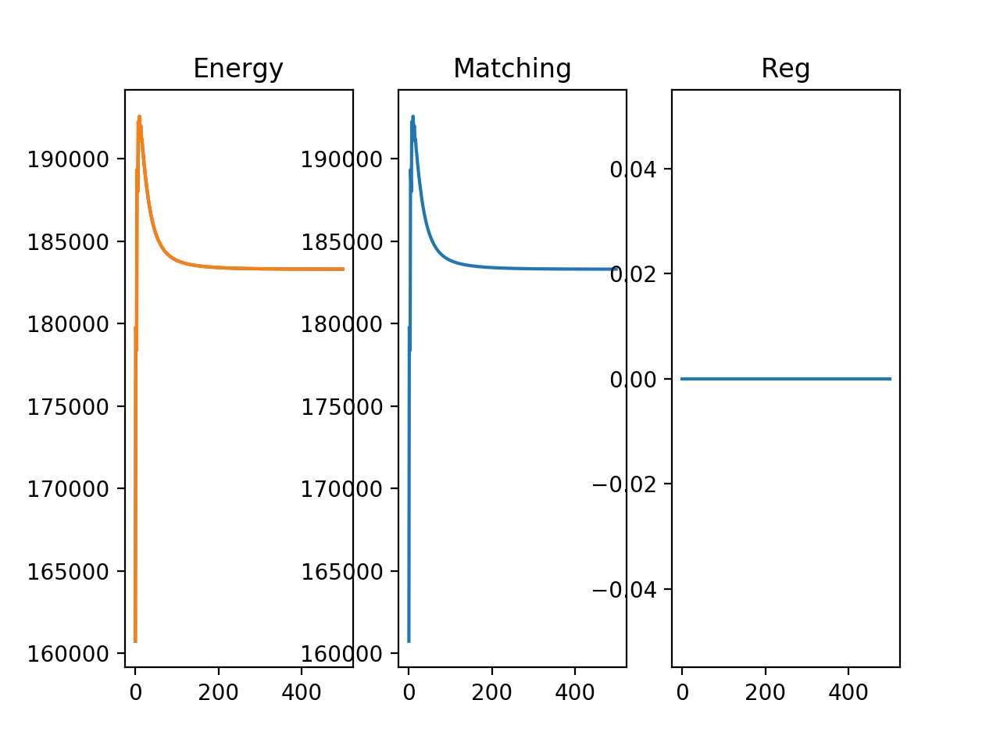

<IPython.core.display.Javascript object>


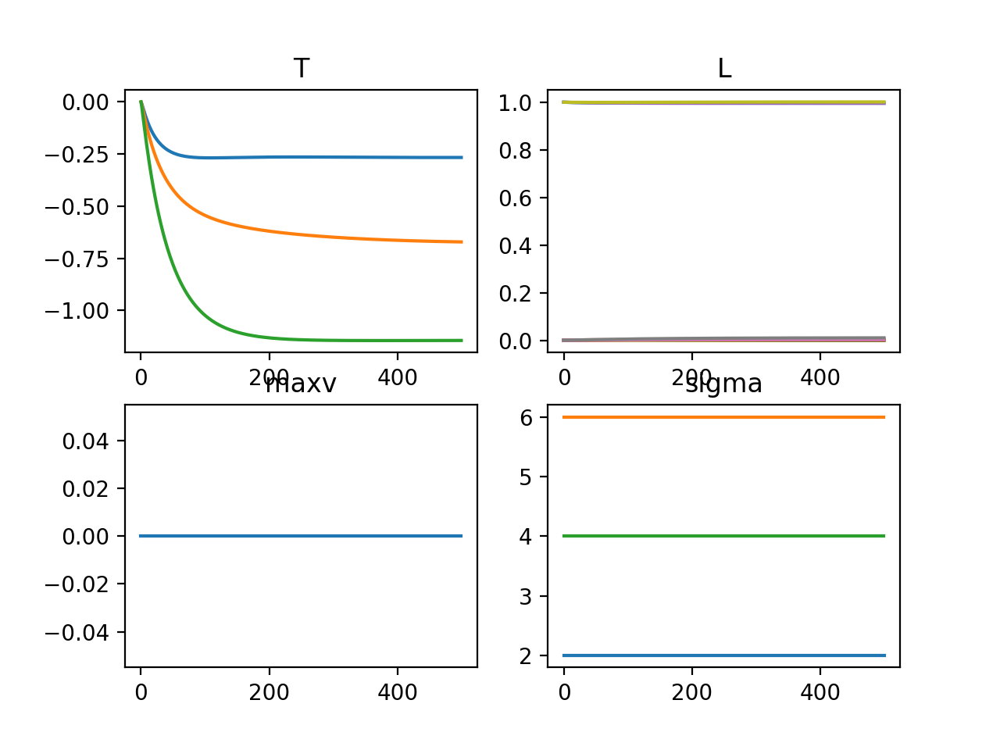

<IPython.core.display.Javascript object>


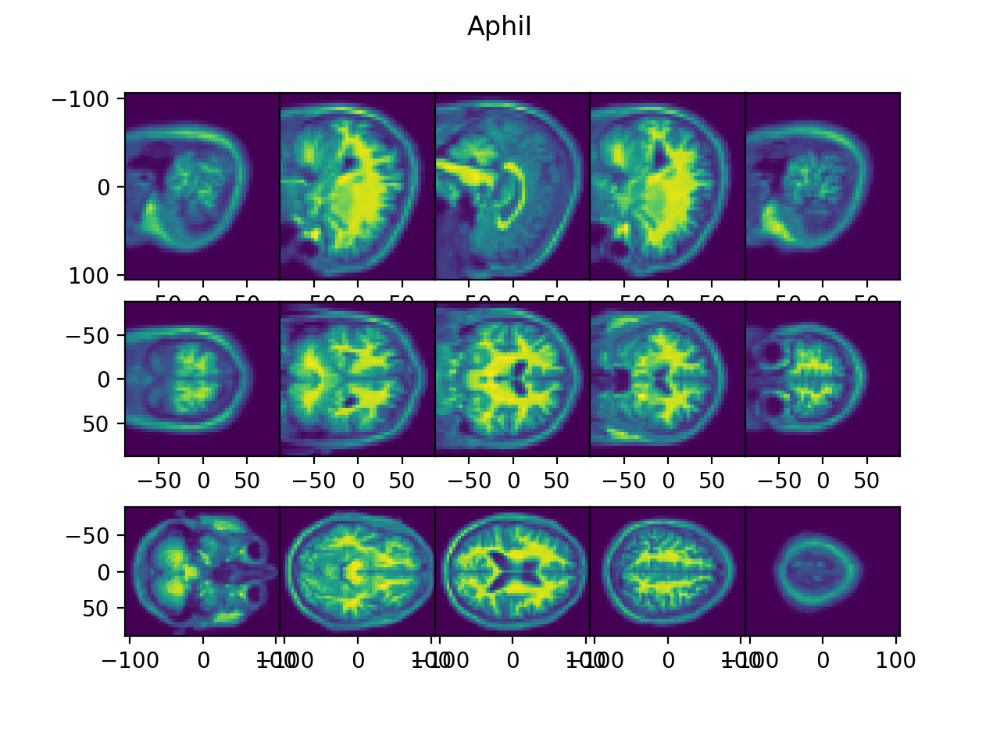

<IPython.core.display.Javascript object>


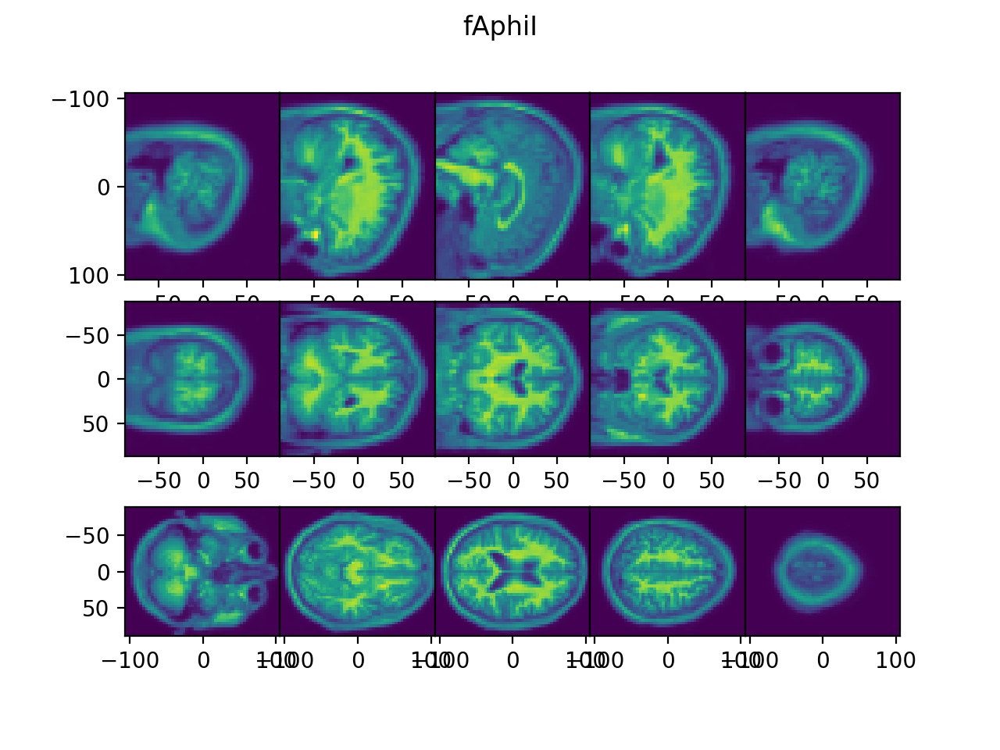

<IPython.core.display.Javascript object>


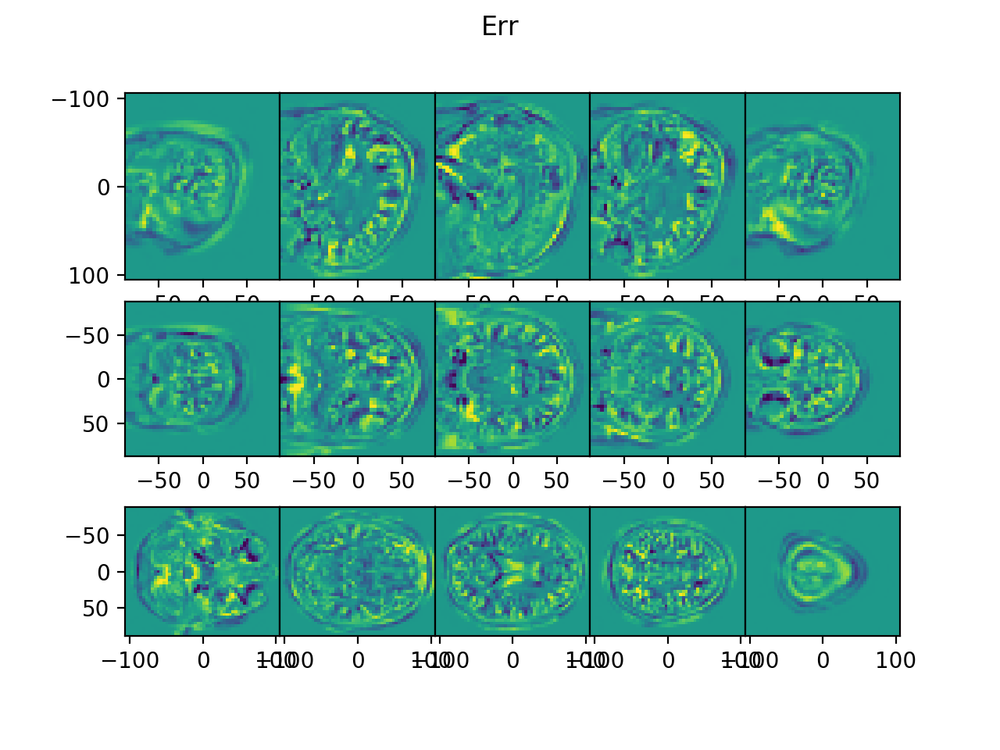

<IPython.core.display.Javascript object>


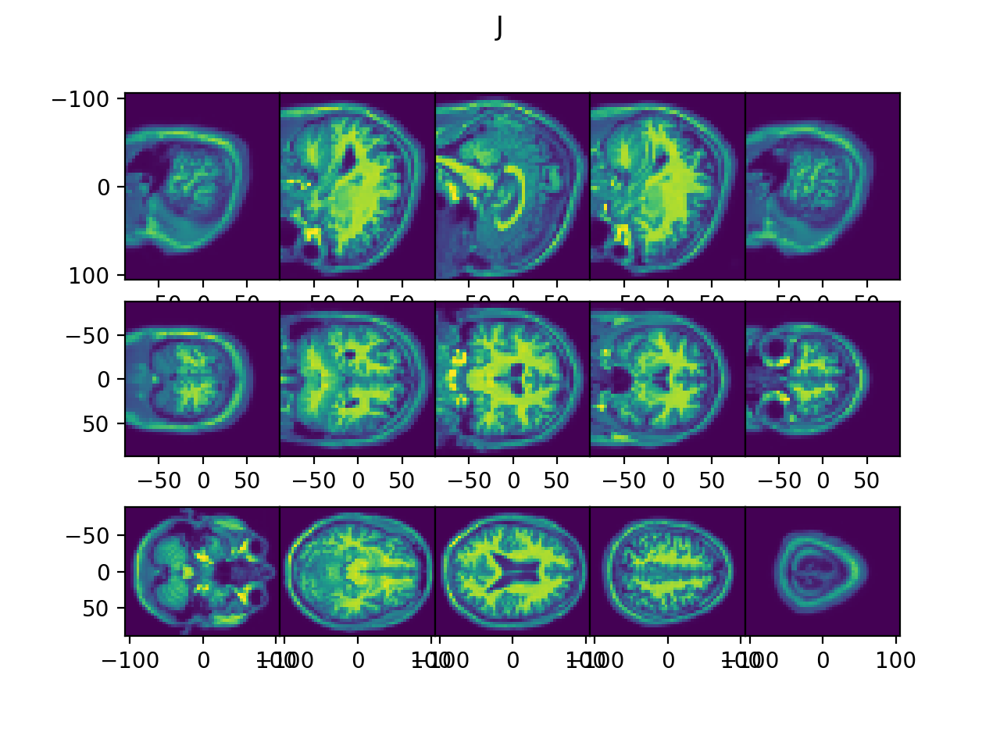

<IPython.core.display.Javascript object>


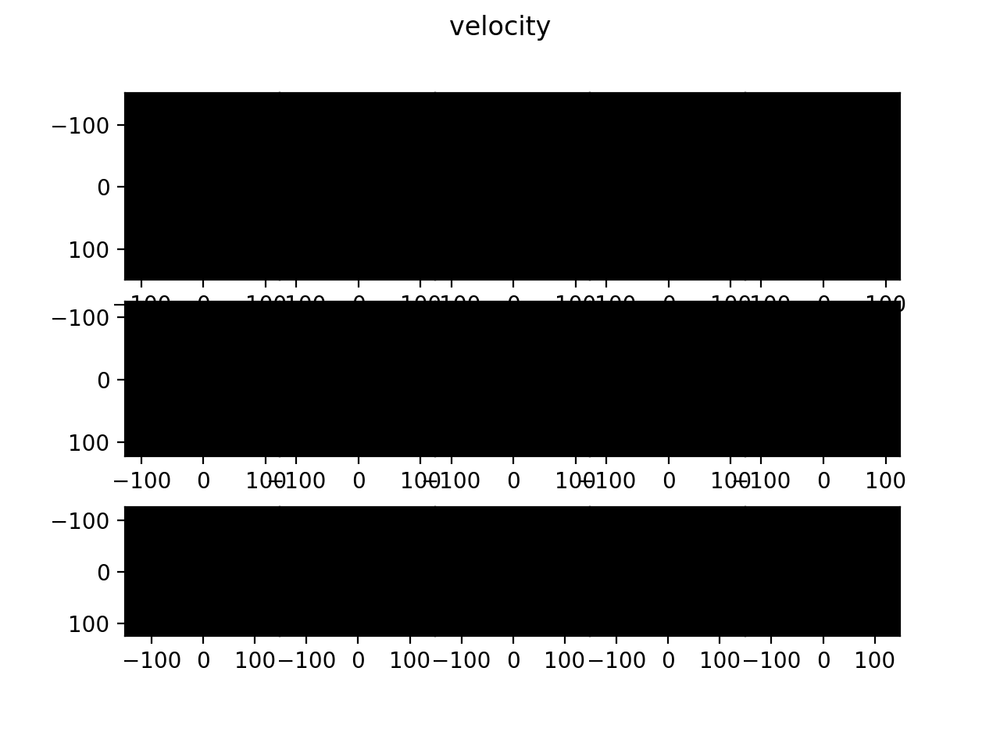

<IPython.core.display.Javascript object>


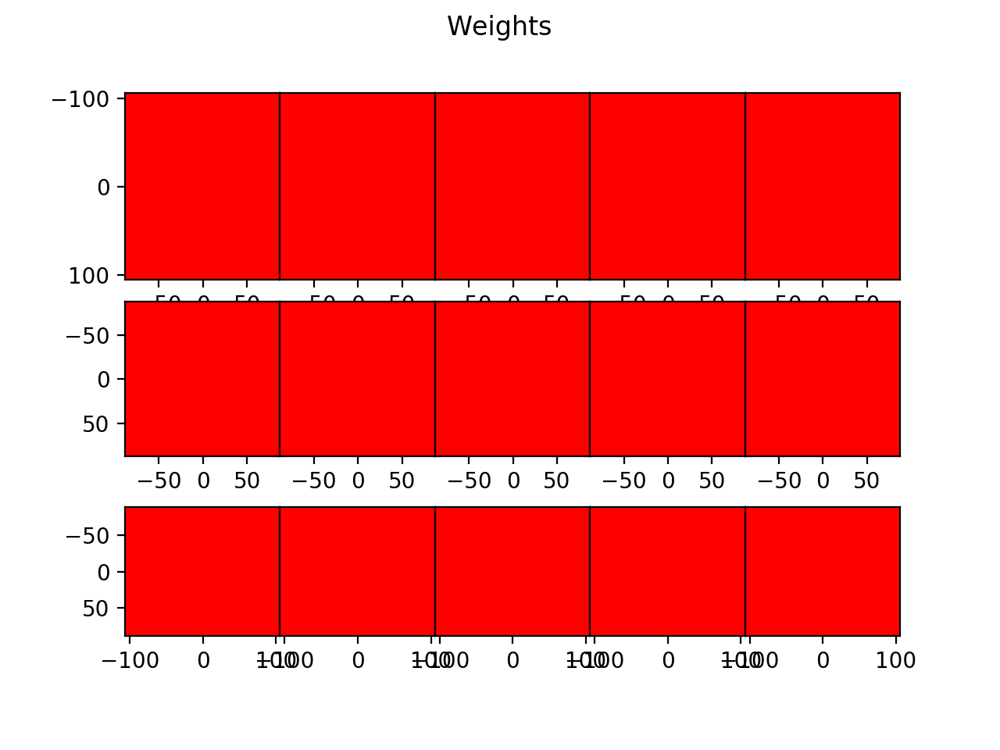

[W Copy.cpp:244] Warning: Casting complex values to real discards the imaginary part (function operator())
../emlddmm.py:100: RuntimeWarning: invalid value encountered in true_divide
  J /= (vmax[:,None,None,None] - vmin[:,None,None,None])


Iteration 450, translation oscilating, reducing eA to 9.0


../emlddmm.py:988: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  v = torch.tensor(v,device=device,dtype=dtype)
../emlddmm.py:1006: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A = torch.tensor(A,device=device,dtype=dtype).detach().clone()


<IPython.core.display.Javascript object>


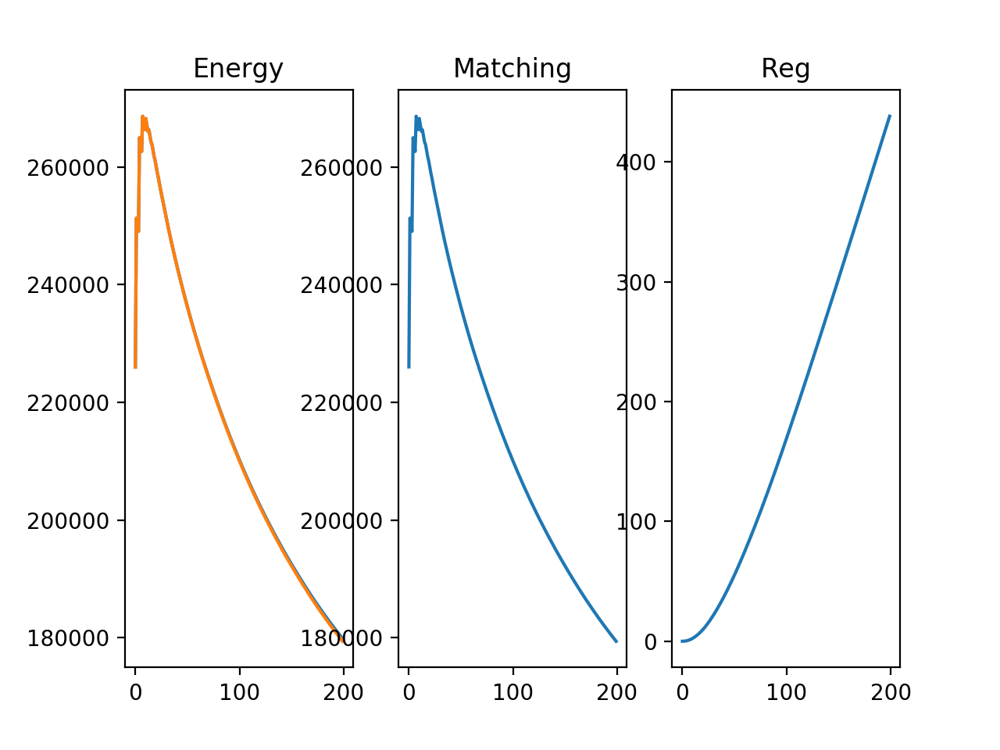

<IPython.core.display.Javascript object>


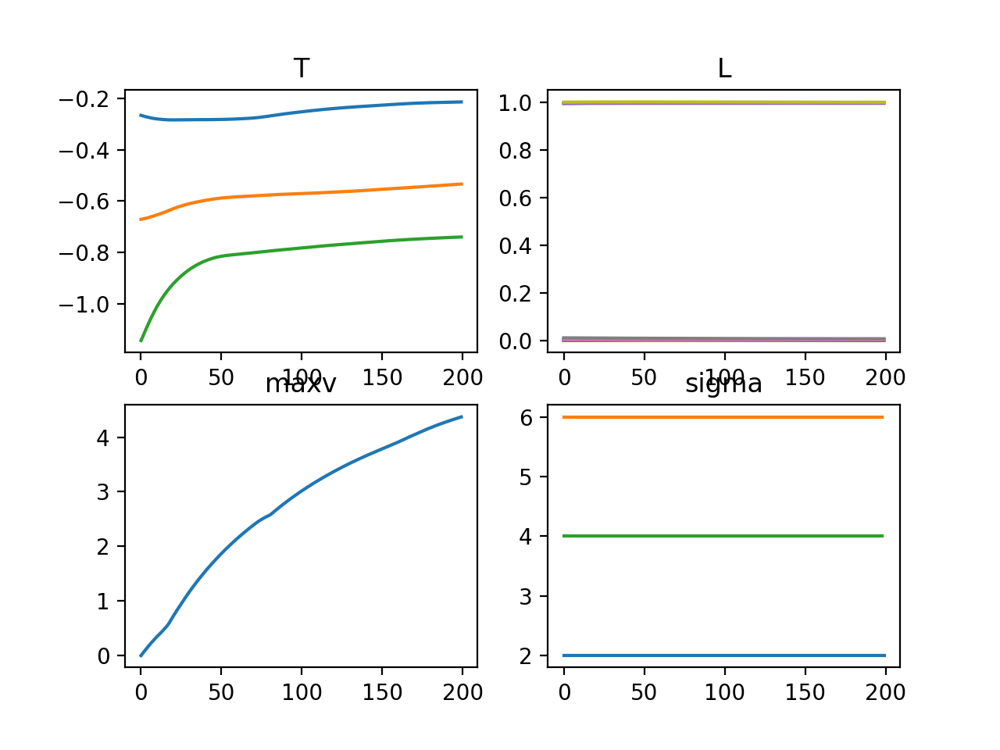

<IPython.core.display.Javascript object>


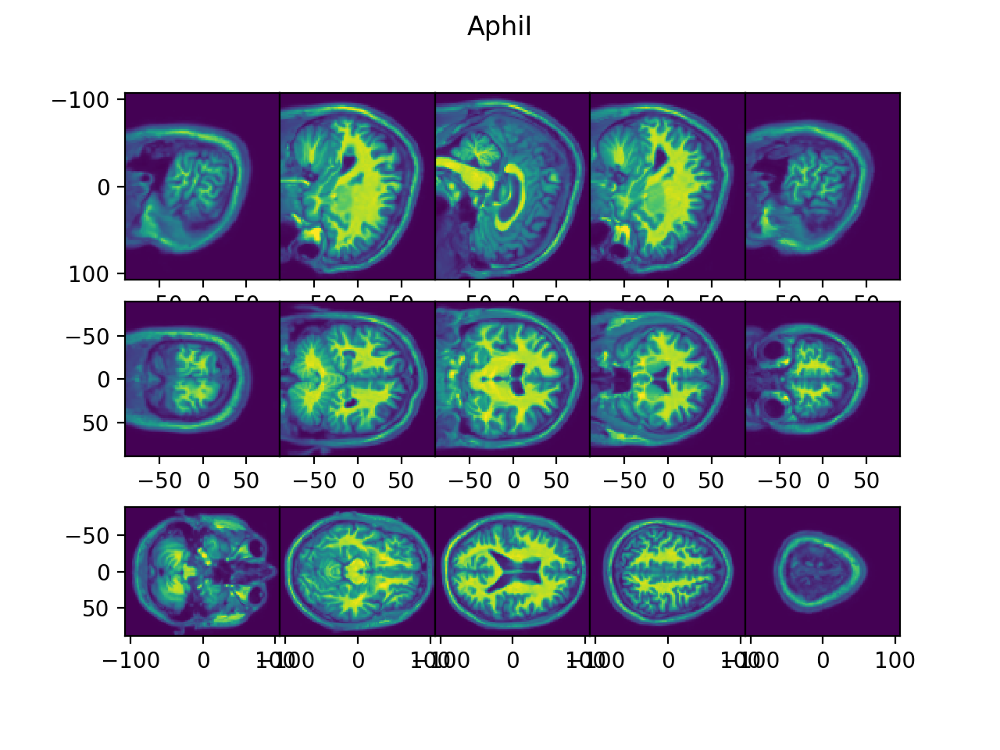

<IPython.core.display.Javascript object>


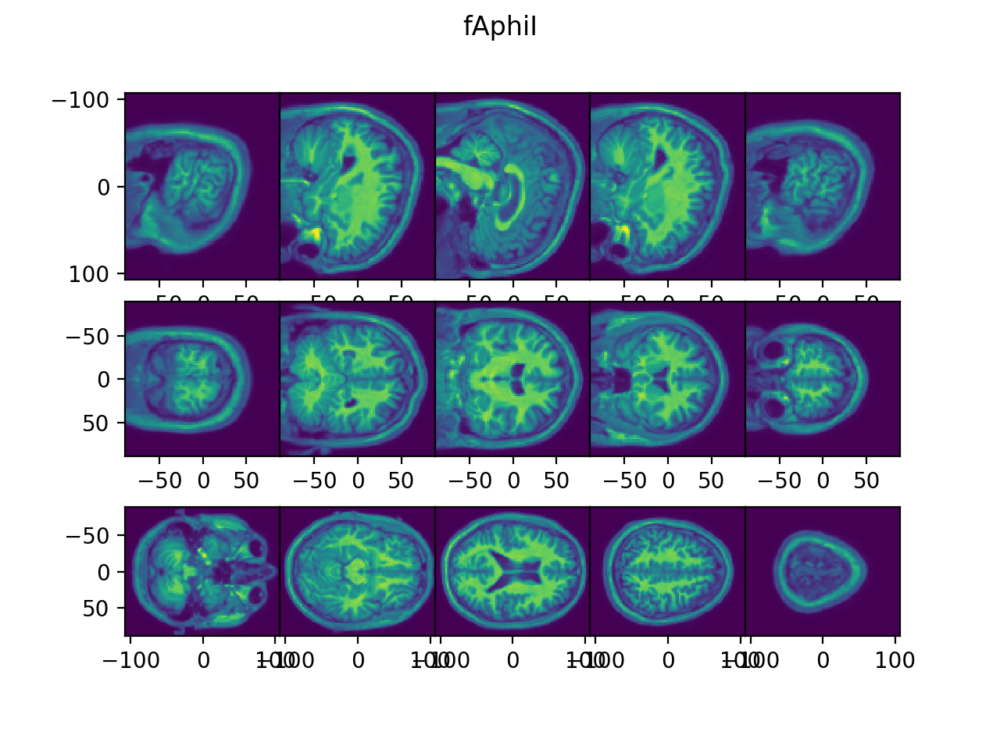

<IPython.core.display.Javascript object>


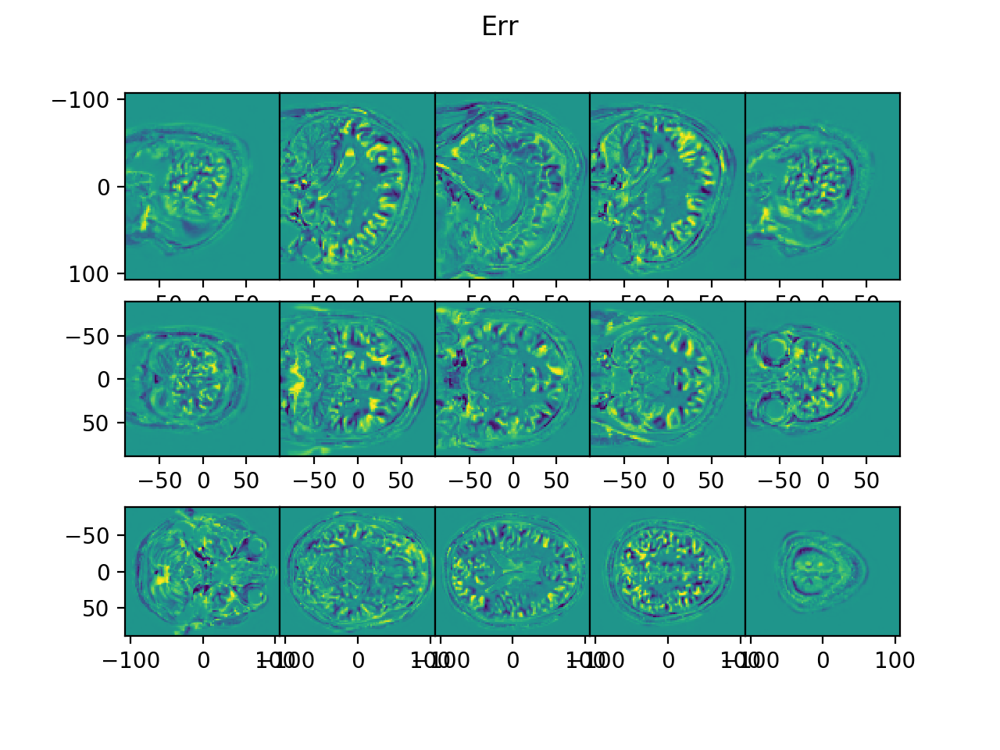

<IPython.core.display.Javascript object>


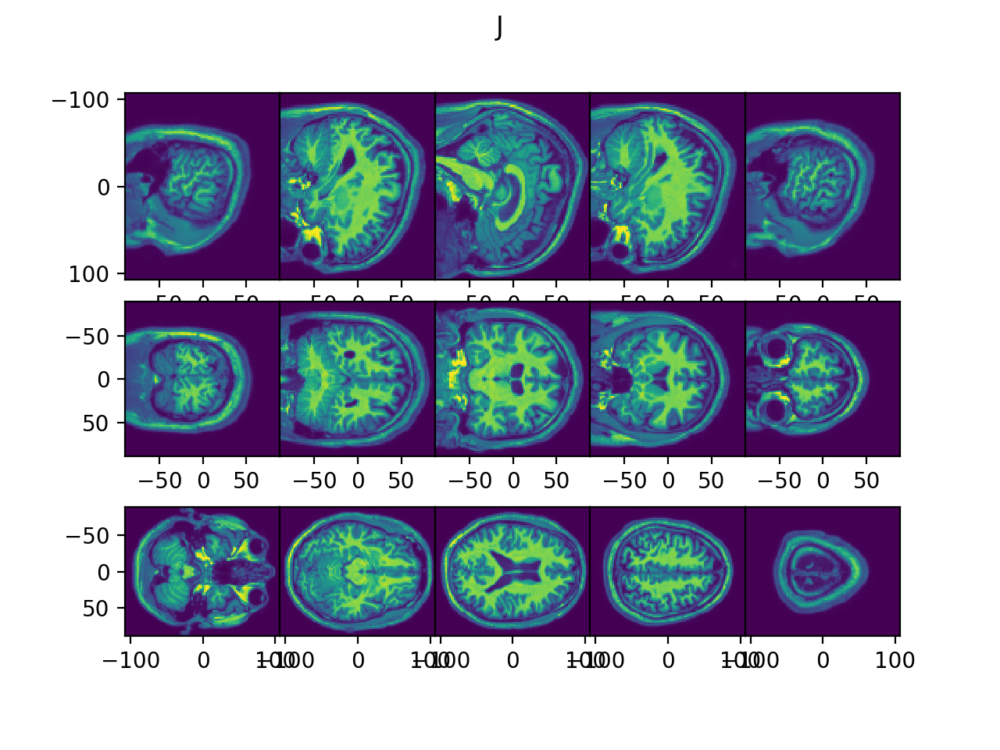

<IPython.core.display.Javascript object>


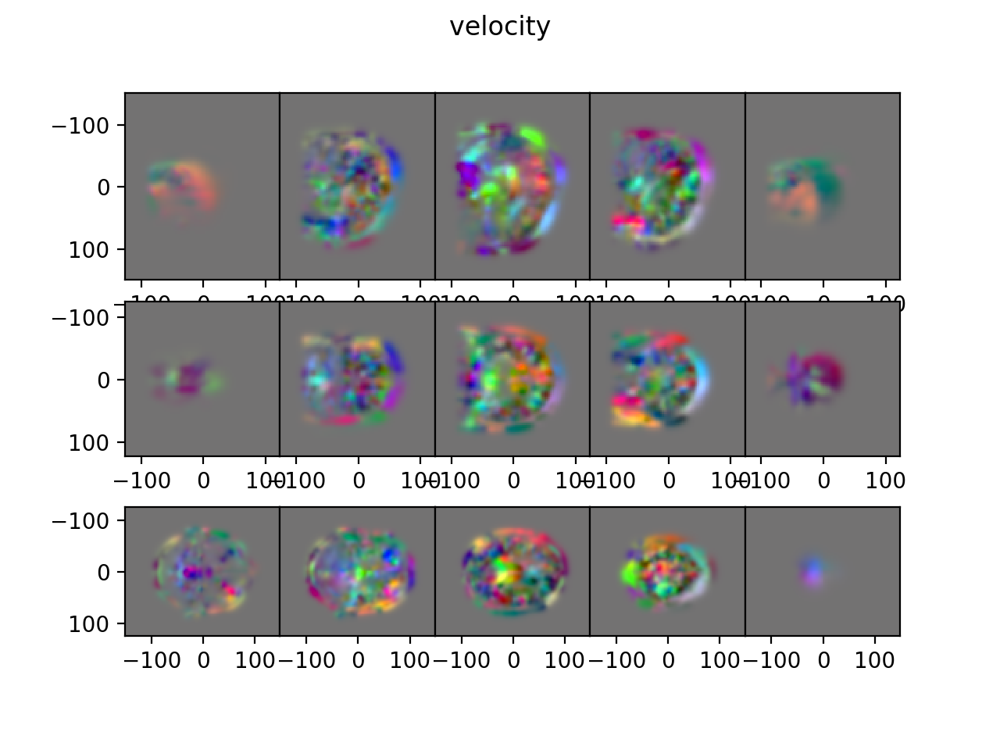

<IPython.core.display.Javascript object>


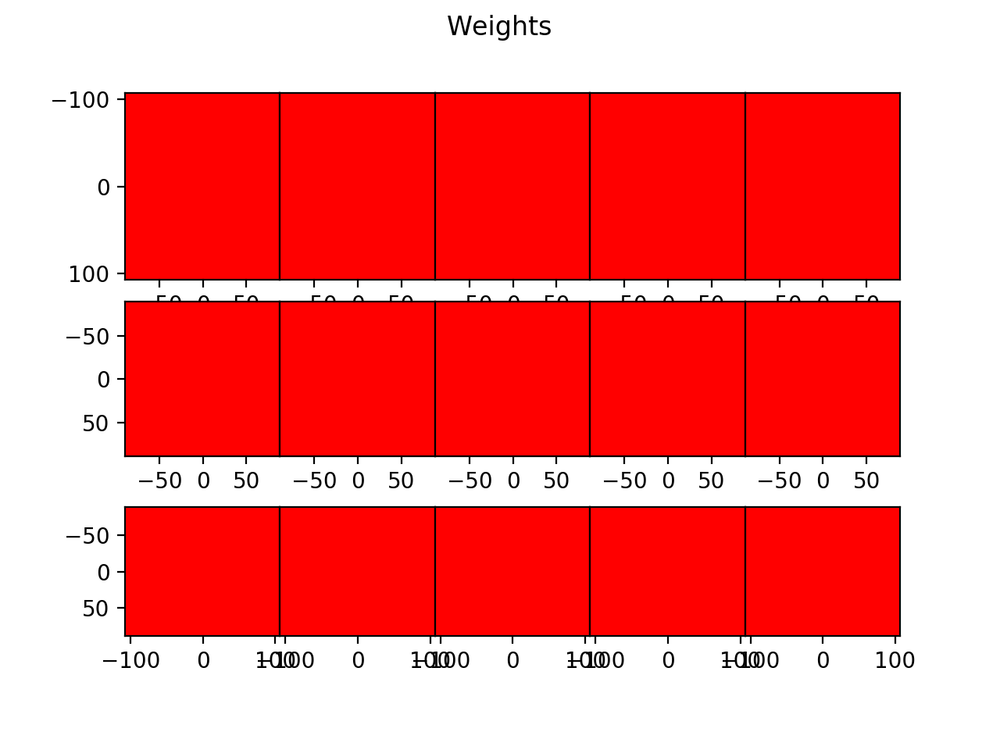

Iteration 20, linear oscilating, reducing eA to 9.0


<IPython.core.display.Javascript object>


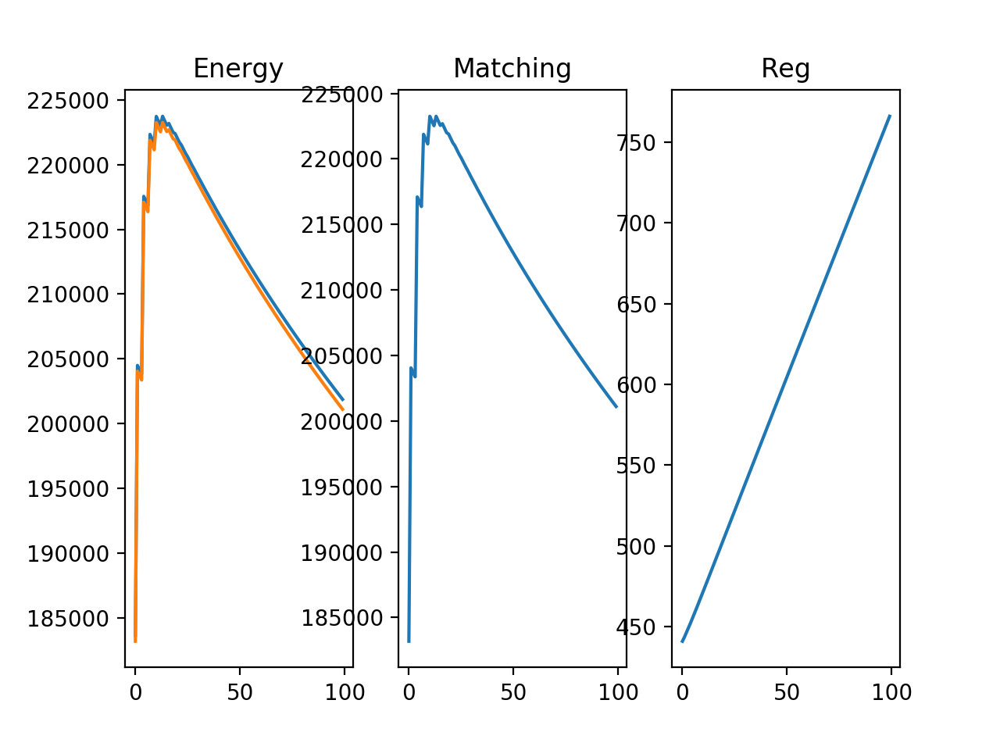

../emlddmm.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figA,axA = plt.subplots(2,2)


<IPython.core.display.Javascript object>


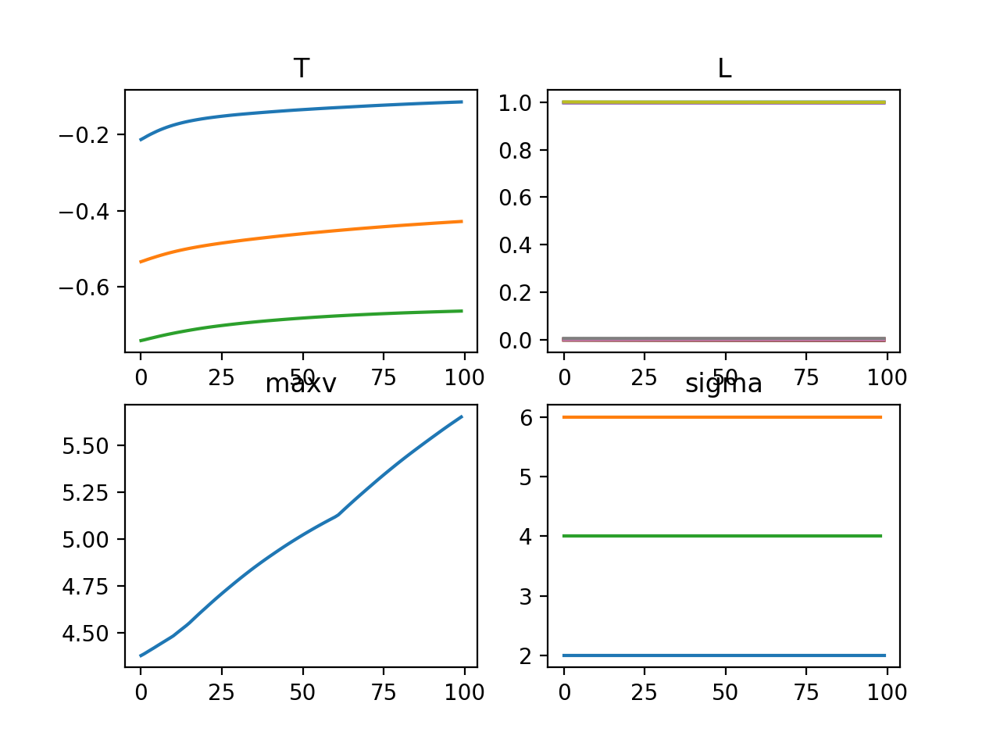

../emlddmm.py:1060: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figI = plt.figure()


<IPython.core.display.Javascript object>


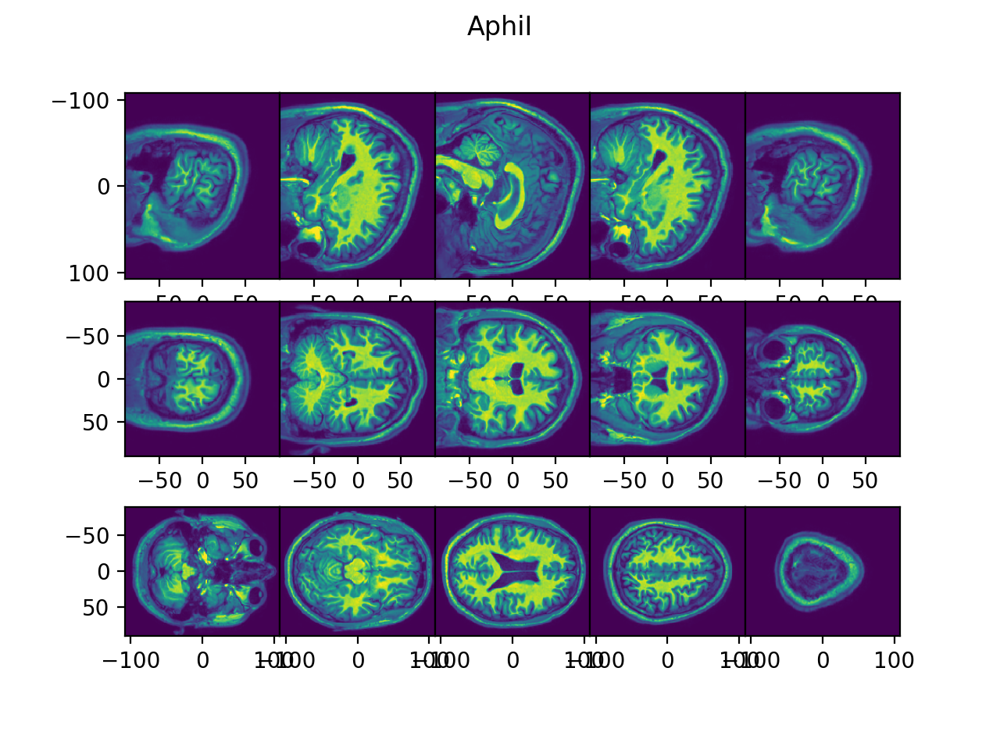

../emlddmm.py:1061: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figfI = plt.figure()


<IPython.core.display.Javascript object>


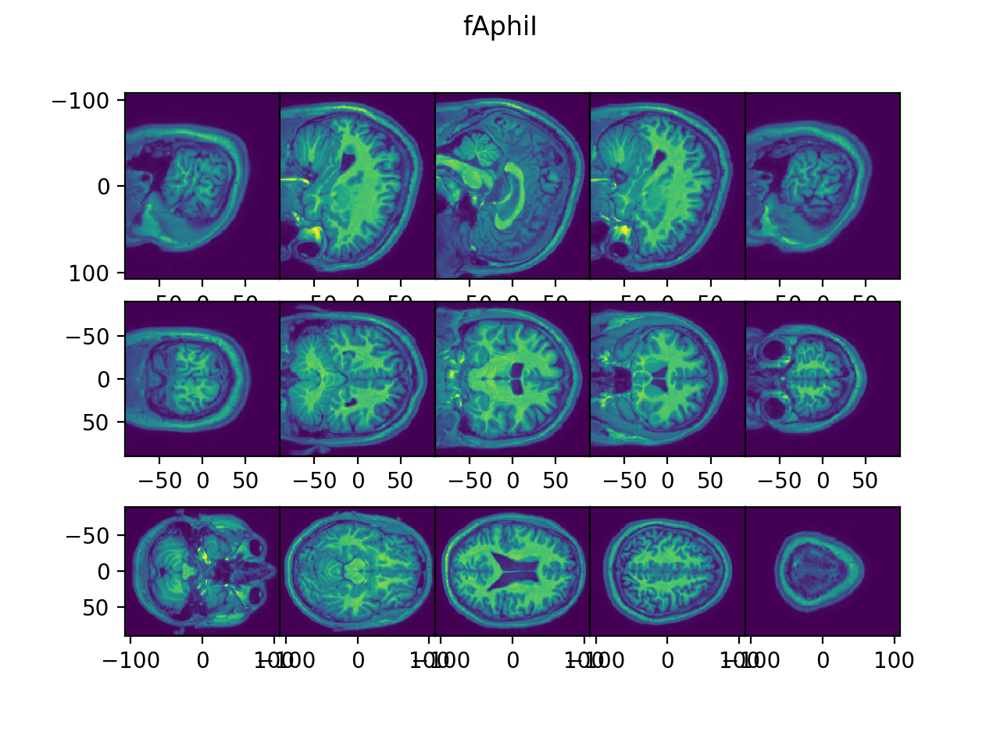

../emlddmm.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figErr = plt.figure()


<IPython.core.display.Javascript object>


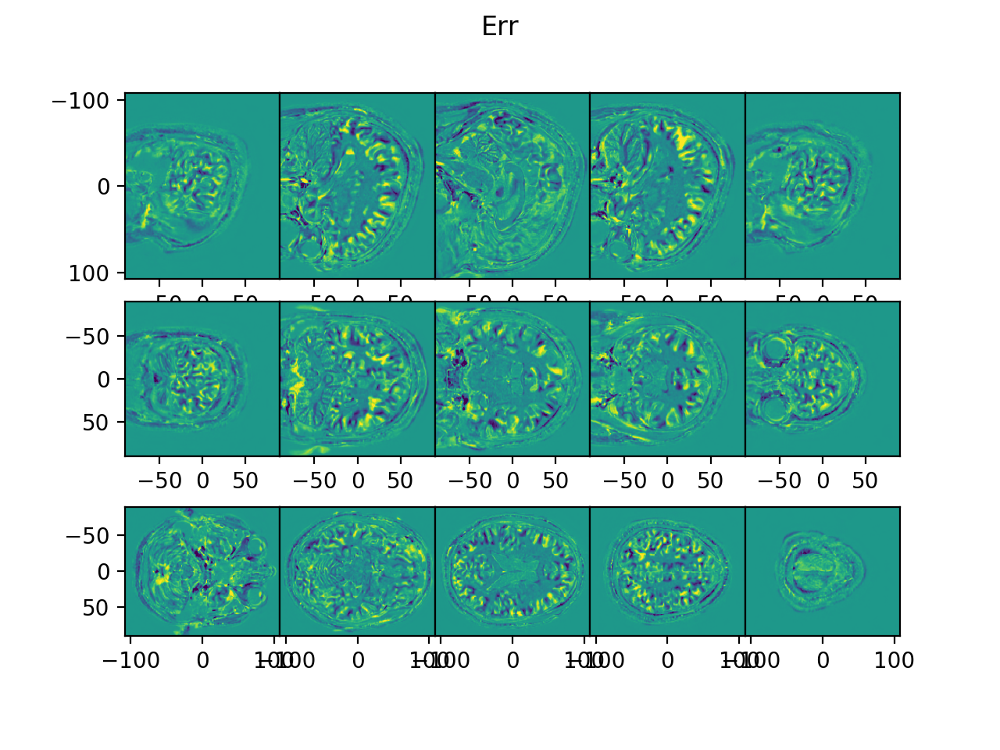

../emlddmm.py:1063: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figJ = plt.figure()


<IPython.core.display.Javascript object>


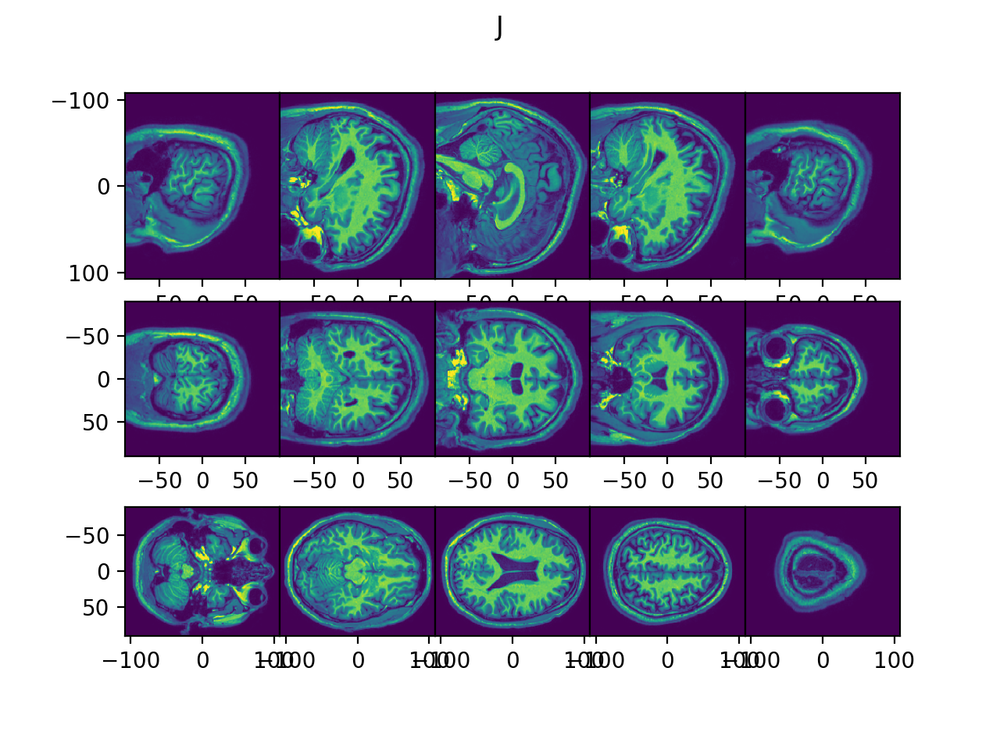

../emlddmm.py:1064: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figV = plt.figure()


<IPython.core.display.Javascript object>


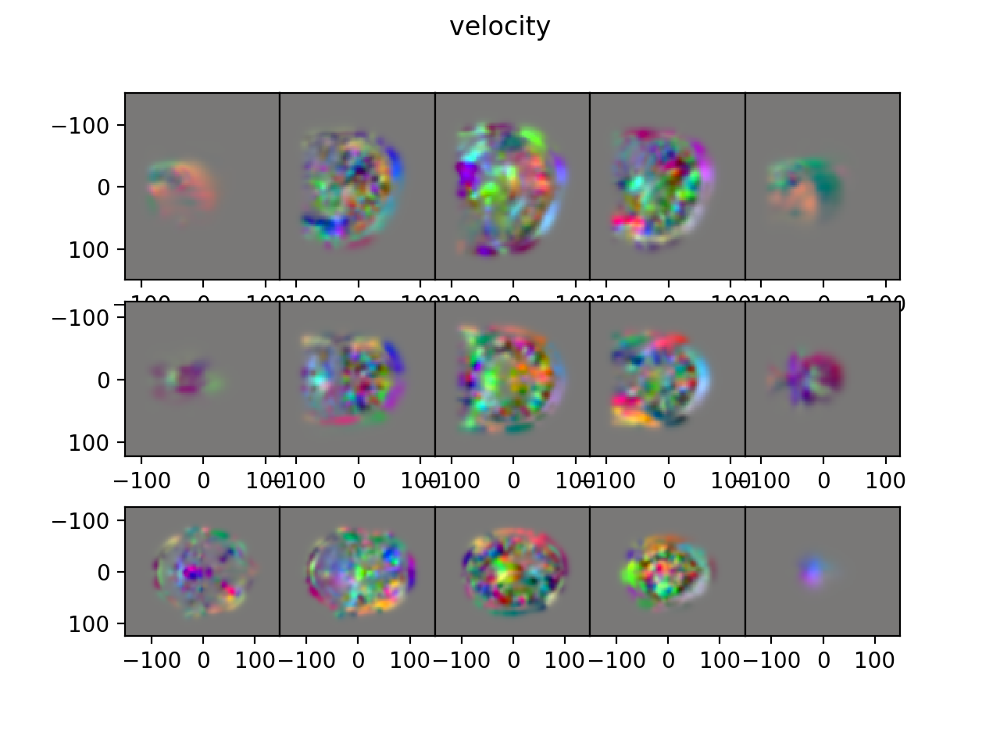

../emlddmm.py:1065: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figW = plt.figure()


<IPython.core.display.Javascript object>


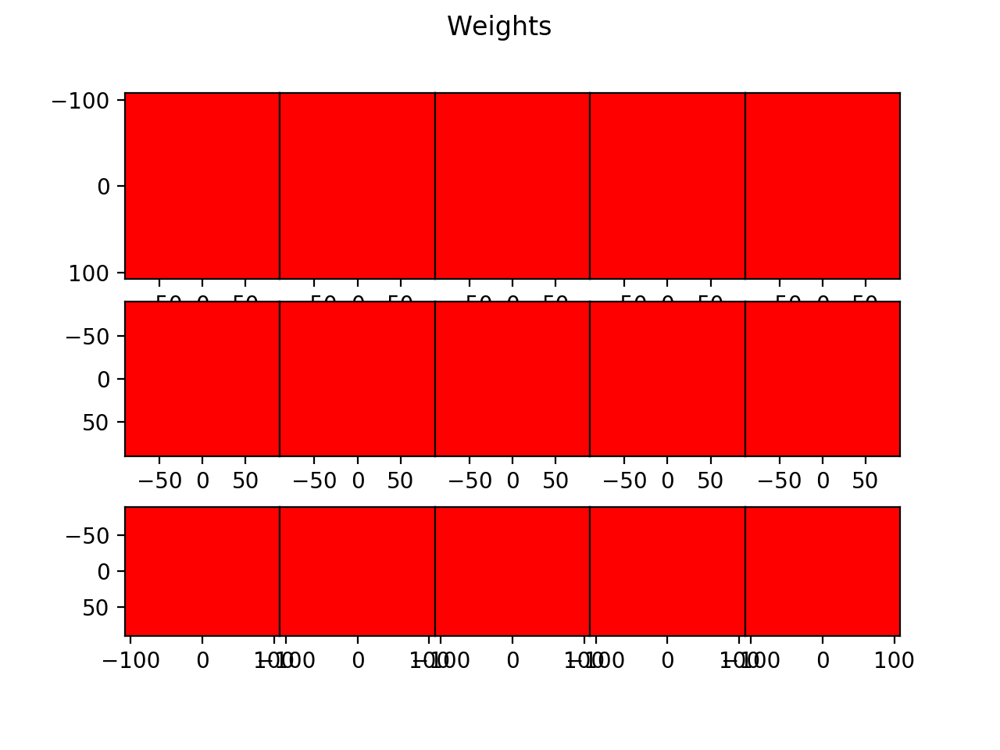

In [10]:
imp.reload(emlddmm)
device = 'cuda:0'
#device = 'cpu'
output = emlddmm.emlddmm_multiscale(I=I,xI=[xI],J=J,xJ=[xJ],W0=W0,device=device,**config)

In [11]:
# write outputs
imp.reload(emlddmm)
emlddmm.write_outputs_for_pair(
    output_dir,output[-1],
    xI,I,xJ,J,WJ=W0,    
)

../emlddmm.py:2919: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  xI,torch.tensor(I,dtype=dtype),'atlas')
../emlddmm.py:2933: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  XI = torch.stack(torch.meshgrid([torch.tensor(x,device=phi.device,dtype=phi.dtype) for x in xI],indexing='ij'),0)
../emlddmm.py:2969: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  xJ,torch.tensor(J,dtype=torch.float32),'atlas')
../emlddmm.py:2978: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone()